## EJERCICIO 1

In [ ]:
#!pip install geopandas

In [ ]:
#!pip install fiona

Lectura de datos y proyecciones

In [ ]:
import geopandas as gpd
from  fiona import listlayers

countries=gpd.read_file('https://github.com/Tracy-12/TAREA_GRUPAL_2/raw/refs/heads/main/maps/World_Countries/World_Countries.shp')
public_hospitals=gpd.read_file('https://github.com/Tracy-12/TAREA_GRUPAL_2/raw/refs/heads/main/Public_hospitals/Public_Hospitals.shp')
eletricity_lines=gpd.read_file('https://github.com/Tracy-12/TAREA_GRUPAL_2/raw/refs/heads/main/Electricity_Transmission_lines/Electricity_Transmission_Lines.shp')
australia_states=gpd.read_file('https://github.com/Tracy-12/TAREA_GRUPAL_2/raw/refs/heads/main/states%20and%20territories%20aus/STE_2021_AUST_GDA2020.shp')
WorldMap="https://github.com/CienciaDeDatosEspacial/intro_geodataframe/raw/main/maps/worldMaps.gpkg"
indicators=gpd.read_file(WorldMap,layer='indicators')

In [ ]:
australia=countries[countries.COUNTRY=='Australia']
australia_3112=australia.to_crs(3112)

Primero se le asigna un crs conocido y luego se proyecta las variables

In [ ]:
public_hospitals = public_hospitals.set_crs(epsg=4326, allow_override=True)
public_hospitals_clipped=gpd.clip(public_hospitals,australia)
public_hospitals_3112=public_hospitals_clipped.to_crs(3112)

In [ ]:
eletricity_lines = eletricity_lines.set_crs(epsg=4326, allow_override=True)
eletricity_lines_clipped=gpd.clip(eletricity_lines,australia)
eletricity_lines_3112=eletricity_lines_clipped.to_crs(3112)

In [ ]:
australia_states = australia_states.set_crs(epsg=4326, allow_override=True)
australia_states_clipped=gpd.clip(australia_states,australia)
australia_states_3112=australia_states_clipped.to_crs(3112)

In [ ]:
#Centroide
australia_centroid=australia.to_crs(3112).centroid
centroidX,centroidY=australia_3112.centroid.x.values[0],australia_3112.centroid.y.values[0]
# the arriba
australia_states_A=australia_states_3112.cx[:,centroidY:]
# the abajo
Public_hospitals_B=public_hospitals_3112.cx[:,:centroidY]

1. Se muestran los puntos por debajo del centroide

<Axes: >

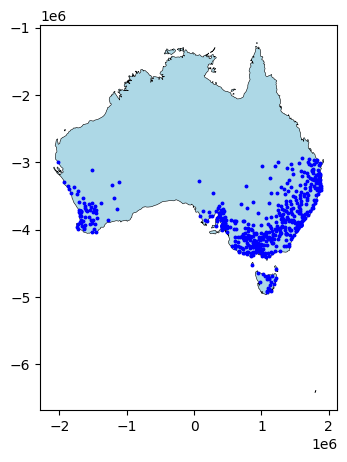

In [ ]:
base = australia_3112.plot(facecolor="lightblue", edgecolor='black', linewidth=0.4,figsize=(5,5))
Public_hospitals_B.plot(marker='.', color='blue', markersize=13,
                    ax=base)

2. Se muestran las lineas que cruzan los estados por encima del centroide

<Axes: >

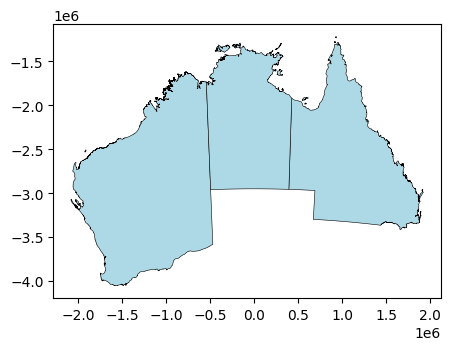

In [ ]:
australia_states_A.plot(facecolor="lightblue", edgecolor='black', linewidth=0.4,figsize=(5,5))

<Axes: >

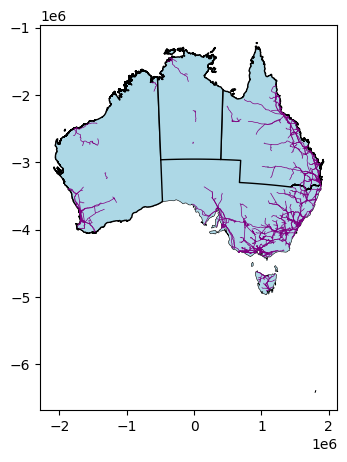

In [ ]:
base = australia_3112.plot(facecolor="lightblue", edgecolor='black', linewidth=0.4,figsize=(5,5))
australia_states_A.plot(facecolor="lightblue", edgecolor='black', linewidth=1,
                    ax=base)
eletricity_lines_3112.plot(edgecolor='purple', linewidth=0.5,
                    ax=base)

## EJERCICIO 2

In [ ]:
import geopandas as gpd

local_gov=gpd.read_file('https://github.com/Tracy-12/TAREA_GRUPAL_2/raw/refs/heads/main/local_goverment%20areas/SA4_2021_AUST_GDA94.shp')
local_gov.head()

,SA4_CODE21,SA4_NAME21,CHG_FLAG21,CHG_LBL21,GCC_CODE21,GCC_NAME21,STE_CODE21,STE_NAME21,AUS_CODE21,AUS_NAME21,AREASQKM21,LOCI_URI21,geometry
0,101,Capital Region,0,No change,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,51896.2444,http://linked.data.gov.au/dataset/asgsed3/SA4/101,"MULTIPOLYGON (((150.0526 -37.26254, 150.05251 ..."
1,102,Central Coast,0,No change,1GSYD,Greater Sydney,1,New South Wales,AUS,Australia,1681.0088,http://linked.data.gov.au/dataset/asgsed3/SA4/102,"MULTIPOLYGON (((151.31496 -33.55579, 151.31496..."
2,103,Central West,0,No change,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,70297.0600,http://linked.data.gov.au/dataset/asgsed3/SA4/103,"POLYGON ((150.14235 -32.34155, 150.14254 -32.3..."
3,104,Coffs Harbour - Grafton,0,No change,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,13229.7577,http://linked.data.gov.au/dataset/asgsed3/SA4/104,"MULTIPOLYGON (((153.07639 -30.42984, 153.07644..."
4,105,Far West and Orana,0,No change,1RNSW,Rest of NSW,1,New South Wales,AUS,Australia,339355.6461,http://linked.data.gov.au/dataset/asgsed3/SA4/105,"POLYGON ((148.67618 -29.50977, 148.67661 -29.5..."


In [ ]:
#se proyecta la variable de local goverment areas
local_gov=local_gov.set_crs(epsg=4326, allow_override=True)
local_gov_clipped=gpd.clip(local_gov,australia)
local_gov_3112=local_gov_clipped.to_crs(3112)

<Axes: >

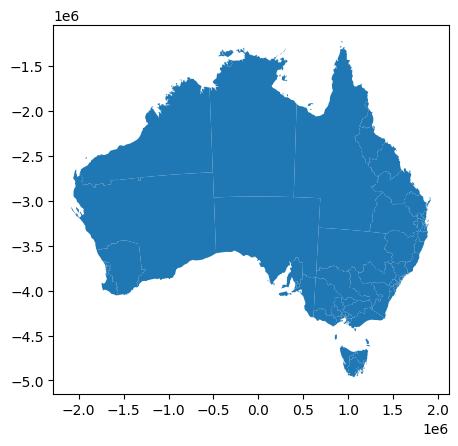

In [ ]:
local_gov_3112.plot()

In [ ]:
#numero de municipios
len(local_gov_3112.SA4_NAME21)

89

In [ ]:
#numero de estados
len(set(local_gov_3112.STE_NAME21))

9

In [ ]:
! pip show shapely

Name: shapely
Version: 2.1.1
Summary: Manipulation and analysis of geometric objects
Home-page: 
Author: Sean Gillies
Author-email: 
License: BSD 3-Clause
Location: /usr/local/lib/python3.11/dist-packages
Requires: numpy
Required-by: bigframes, geopandas, google-cloud-aiplatform, libpysal


1. Se crea un subconjunto de poligonos del estado de New South Wales, con la funcion union

<Axes: >

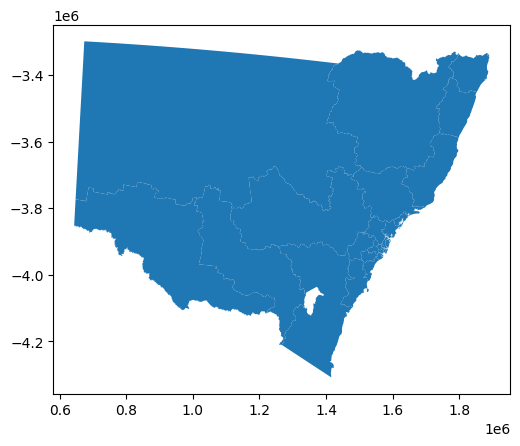

In [ ]:
local_gov_3112[local_gov_3112.STE_NAME21=='New South Wales'].plot()

In [ ]:
local_gov_3112[local_gov_3112.STE_NAME21=='New South Wales'].union_all()

In [ ]:
#Conversion de geoDf
new_south_wales=local_gov_3112[local_gov_3112.STE_NAME21=='New South Wales'].union_all()
new_south_wales_gdf=gpd.GeoDataFrame(index=[0],data={'ADM':'New South Wales'},
                 crs=local_gov_3112.crs,
                 geometry=[new_south_wales])

<Axes: >

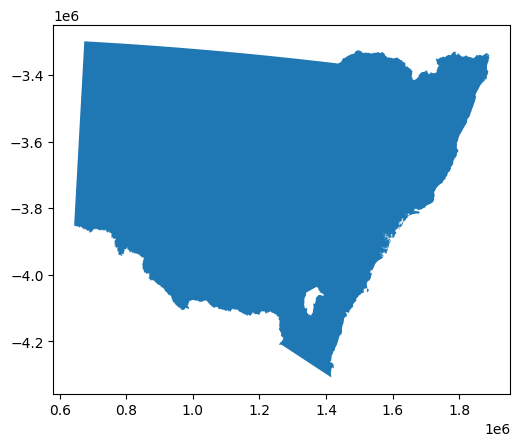

In [ ]:
new_south_wales_gdf.plot()

2. Se muestran la union de las municipalidades en estados con la funcion dissolve

<Axes: >

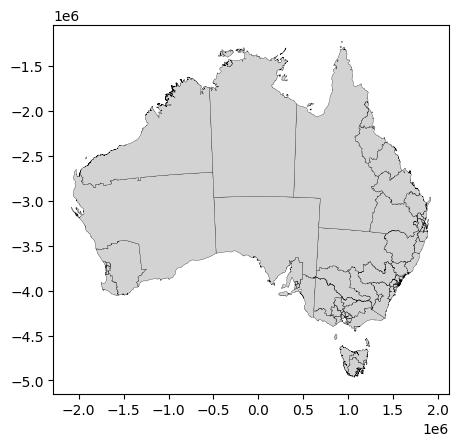

In [ ]:
local_gov_3112.plot(facecolor='lightgrey', edgecolor='black',linewidth=0.2)

<Axes: >

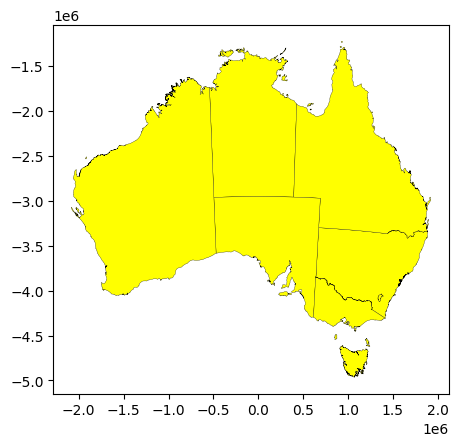

In [ ]:
local_gov_3112.dissolve(by='STE_NAME21').plot(facecolor='yellow', edgecolor='black',linewidth=0.2)

3. Se  muestra el mapa donde se aplica la funcion dissolve y aggregating de la mediana de los valores para el mapa del mundo

In [ ]:
indicators.dissolve(
     by="region",
     aggfunc={
         "COUNTRY": "count",
         "fragility": ["median"],
         "co2": ["median"],
         "ForestRev_gdp": ["median"]
     },as_index=False,
 )

,region,geometry,"(COUNTRY, count)","(fragility, median)","(co2, median)","(ForestRev_gdp, median)"
0,AFRICA,"MULTIPOLYGON (((-2.92813 5.10022, -2.93222 5.1...",51,87.40,4444000.0,2.470
1,AUSTRALIA AND OCEANIA,"MULTIPOLYGON (((-176.51779 -43.90778, -176.532...",6,67.95,1023000.0,0.385
2,CENTRAL AMERICA AND THE CARIBBEAN,"MULTIPOLYGON (((-81.71556 7.44681, -81.71362 7...",16,61.00,7873500.0,0.115
3,CENTRAL ASIA,"MULTIPOLYGON (((50.03472 45.04833, 50.0425 45....",6,75.20,106001000.0,0.005
4,EAST AND SOUTHEAST ASIA,"MULTIPOLYGON (((105.26361 -6.54472, 105.26138 ...",15,70.40,238983000.0,0.180
5,EUROPE,"MULTIPOLYGON (((-18.13223 27.77264, -18.1132 2...",39,40.50,38739000.0,0.150
6,MIDDLE EAST,"MULTIPOLYGON (((42.76819 14.06653, 42.7868 14....",16,72.60,68706500.0,0.000
7,NORTH AMERICA,"MULTIPOLYGON (((-155.211 20.00166, -155.18335 ...",3,38.00,612084000.0,0.080
8,SOUTH AMERICA,"MULTIPOLYGON (((-74.93431 -51.85501, -74.93251...",11,68.20,36051000.0,0.490
9,SOUTH ASIA,"MULTIPOLYGON (((73.10193 -0.58431, 73.09915 -0...",8,84.35,15916000.0,0.120


In [ ]:
#!pip install mapclassify

<Axes: >

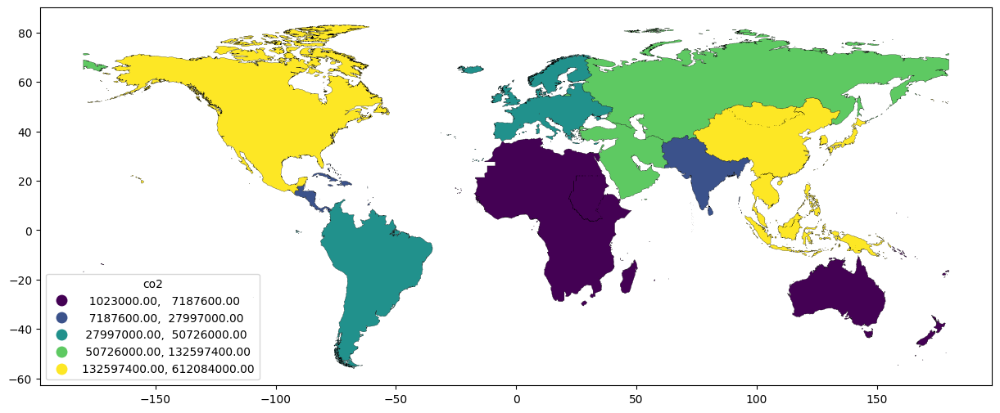

In [ ]:
indicatorsByRegion=indicators.dissolve(
     by="region",
     aggfunc={
         "COUNTRY": "count",
         "fragility": ["median"],
         "co2": ["median"],
         "ForestRev_gdp": ["median"]
     },as_index=False,
 )
indicatorsByRegion.plot(column =('co2', 'median'),scheme='quantiles', cmap='viridis',
                        legend=True,
                        legend_kwds={"title": "co2",'loc': 'lower left'},
                        edgecolor='black',linewidth=0.2,
                        figsize=(15, 10))

## EJERCICIO 3

In [ ]:
liquid_fluel_terminals=gpd.read_file('https://github.com/Tracy-12/TAREA_GRUPAL_2/raw/refs/heads/main/Liquid_fuel_terminals/Liquid_Fuel_Terminals.shp')
liquid_fluel_terminals=liquid_fluel_terminals.set_crs(epsg=4326, allow_override=True)
liquid_fluel_terminals_clipped=gpd.clip(liquid_fluel_terminals,australia)
liquid_fluel_terminals_3112=liquid_fluel_terminals_clipped.to_crs(3112)

In [ ]:
liquid_fluel_terminals_3112.head()

,objectid,featuretyp,descriptio,class,name,operationa,operator,owner,address,suburb,state,spatialcon,revised,sdedistsbu,geometry
34,35,Fuel Terminal,A facility used for the storage of petroleum p...,Fuel Terminal,Devonport,Operational,Shell,Shell,9 Devonport Road,Devonport,Tasmania,5,2012-06-11,37,POINT (1055890.678 -4684269.291)
33,34,Fuel Terminal,A facility used for the storage of petroleum p...,Fuel Terminal,Burnie,Operational,BP,BP,4 River Road,Wivenhoe,Tasmania,5,2012-06-11,36,POINT (1019707.651 -4666647.377)
77,78,Fuel Terminal,A facility used for the storage of petroleum p...,Fuel Terminal,Burnie,Operational,BP,BP,1 River Road,Wivenhoe,Tasmania,5,2012-06-11,36,POINT (1019986.85 -4666424.01)
61,62,Fuel Terminal,A facility used for the storage of petroleum p...,Fuel Terminal,Hastings,Operational,United,United,Barclay Crescent,Hastings,Victoria,5,2020-08-21,65,POINT (985479.99 -4349577.794)
71,72,Fuel Terminal,A facility used for the storage of petroleum p...,Fuel Terminal,Geelong,Operational,Terminals Pty Ltd,Terminals Pty Ltd,40 Wharf Road,Corio,Victoria,5,2020-08-21,75,POINT (915811.43 -4320373.386)


<Axes: >

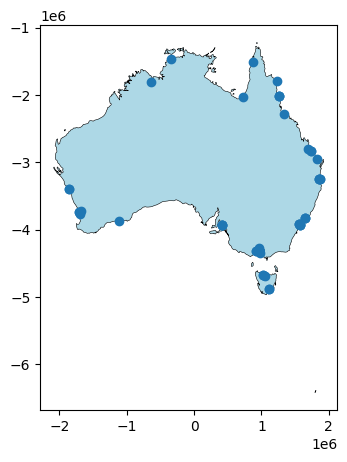

In [ ]:
base = australia_3112.plot(facecolor="lightblue", edgecolor='black', linewidth=0.4,figsize=(5,5))
liquid_fluel_terminals_3112.plot(ax=base)

1. Se selecciona ciertos puntos de la data

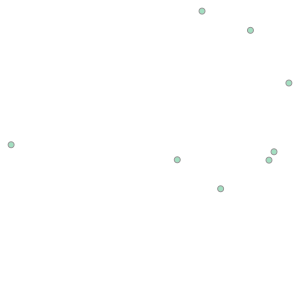

In [ ]:
decommissioned_terminals=liquid_fluel_terminals_3112[liquid_fluel_terminals_3112.operationa=='Decommissioned']
decommissioned_terminals.union_all()

2. Figura convexa de los puntos

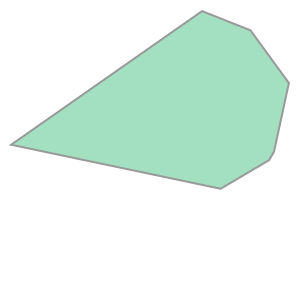

In [ ]:
decommissioned_terminals=liquid_fluel_terminals_3112[liquid_fluel_terminals_3112.operationa=='Decommissioned']
decommissioned_terminals.union_all().convex_hull

3. Conversion a geoDF

In [ ]:
decommissioned_terminals_hull= gpd.GeoDataFrame(index=[0],
                                    crs=decommissioned_terminals.crs,
                                    geometry=[decommissioned_terminals.union_all().convex_hull])
decommissioned_terminals_hull['name']='seaplan  base hull' # optional
decommissioned_terminals_hull

,geometry,name
0,"POLYGON ((962949.727 -4296539.153, -1703224.23...",seaplan base hull


4. Mapa con los puntos y la figura

<Axes: >

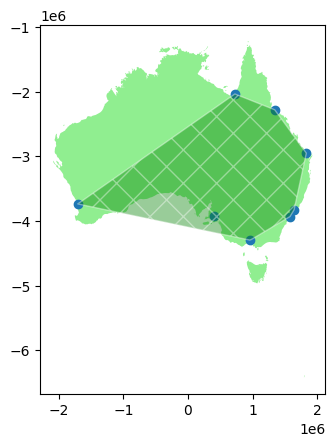

In [ ]:
base=australia_3112.plot(facecolor='lightgreen')
decommissioned_terminals.plot(ax=base)
decommissioned_terminals_hull.plot(ax=base,facecolor='green',
                       edgecolor='white',alpha=0.4,
                       hatch='X')

##EJERCICIO 4

In [ ]:
statistical_areas=gpd.read_file('https://github.com/Tracy-12/TAREA_GRUPAL_2/raw/refs/heads/main/Statistical_areas_N2/SA2_2021_AUST_GDA94.shp')
statistical_areas=statistical_areas.set_crs(epsg=4326, allow_override=True)
statistical_areas_clipped=gpd.clip(statistical_areas,australia)
statistical_areas_3112=statistical_areas_clipped.to_crs(3112)

In [ ]:
#Centroide y coordenadas
centroidX,centroidY=australia_3112.centroid.x.values[0],australia_3112.centroid.y.values[0]
statistical_areas_3112_N=statistical_areas_3112.cx[:,centroidY:] # the north
statistical_areas_3112_S=statistical_areas_3112.cx[:,:centroidY] # the south
statistical_areas_3112__W=statistical_areas_3112.cx[:centroidX,:] # the west
statistical_areas_3112_E=statistical_areas_3112.cx[centroidX:,:] # the east

INTERSECCION

<Axes: >

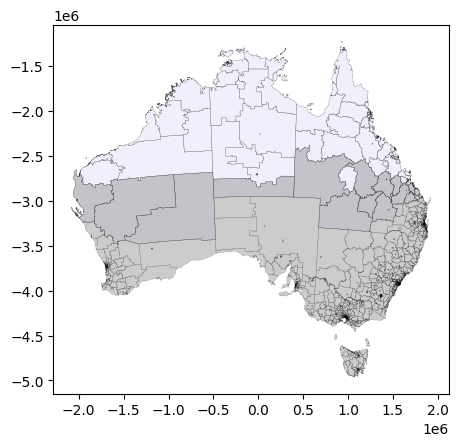

In [ ]:
base=statistical_areas_3112_N.plot(facecolor='lavender', edgecolor='black',linewidth=0.2, alpha=0.6)
statistical_areas_3112_S.plot(facecolor='grey', edgecolor='black',linewidth=0.2,ax=base, alpha=0.4)

<Axes: >

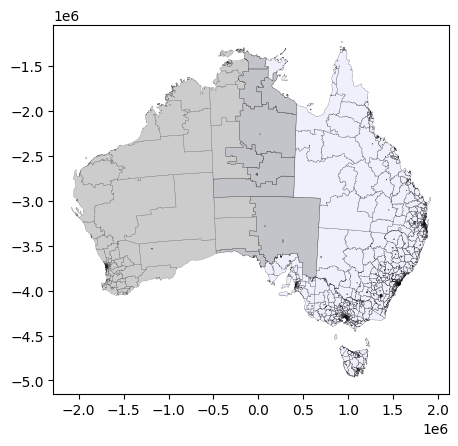

In [ ]:
base=statistical_areas_3112_E.plot(facecolor='lavender', edgecolor='black',linewidth=0.2, alpha=0.6)
statistical_areas_3112__W.plot(facecolor='grey', edgecolor='black',linewidth=0.2,ax=base, alpha=0.4)

<Axes: >

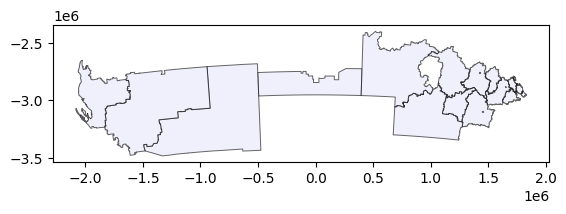

In [ ]:
#interseccion N & S
statistical_areas_3112_NS=statistical_areas_3112_N.overlay(statistical_areas_3112_S, how="intersection",keep_geom_type=True)
statistical_areas_3112_NS.plot(facecolor='lavender', edgecolor='black',linewidth=0.7, alpha=0.6)

<Axes: >

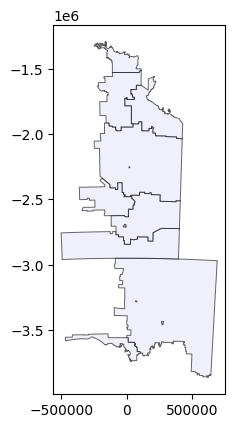

In [ ]:
#interseccion W & E
statistical_areas_3112_WE=statistical_areas_3112__W.overlay(statistical_areas_3112_E, how="intersection",keep_geom_type=True)
statistical_areas_3112_WE.plot(facecolor='lavender', edgecolor='black',linewidth=0.7, alpha=0.6)

**UNION DE LA INTERSECCION**

In [ ]:
statistical_areas_3112_NS.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   SA2_CODE21_1  17 non-null     object  
 1   SA2_NAME21_1  17 non-null     object  
 2   CHG_FLAG21_1  17 non-null     object  
 3   CHG_LBL21_1   17 non-null     object  
 4   SA3_CODE21_1  17 non-null     object  
 5   SA3_NAME21_1  17 non-null     object  
 6   SA4_CODE21_1  17 non-null     object  
 7   SA4_NAME21_1  17 non-null     object  
 8   GCC_CODE21_1  17 non-null     object  
 9   GCC_NAME21_1  17 non-null     object  
 10  STE_CODE21_1  17 non-null     object  
 11  STE_NAME21_1  17 non-null     object  
 12  AUS_CODE21_1  17 non-null     object  
 13  AUS_NAME21_1  17 non-null     object  
 14  AREASQKM21_1  17 non-null     float64 
 15  LOCI_URI21_1  17 non-null     object  
 16  SA2_CODE21_2  17 non-null     object  
 17  SA2_NAME21_2  17 non-null     object  
 18  CHG_

In [ ]:
statistical_areas_3112_WE.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   SA2_CODE21_1  9 non-null      object  
 1   SA2_NAME21_1  9 non-null      object  
 2   CHG_FLAG21_1  9 non-null      object  
 3   CHG_LBL21_1   9 non-null      object  
 4   SA3_CODE21_1  9 non-null      object  
 5   SA3_NAME21_1  9 non-null      object  
 6   SA4_CODE21_1  9 non-null      object  
 7   SA4_NAME21_1  9 non-null      object  
 8   GCC_CODE21_1  9 non-null      object  
 9   GCC_NAME21_1  9 non-null      object  
 10  STE_CODE21_1  9 non-null      object  
 11  STE_NAME21_1  9 non-null      object  
 12  AUS_CODE21_1  9 non-null      object  
 13  AUS_NAME21_1  9 non-null      object  
 14  AREASQKM21_1  9 non-null      float64 
 15  LOCI_URI21_1  9 non-null      object  
 16  SA2_CODE21_2  9 non-null      object  
 17  SA2_NAME21_2  9 non-null      object  
 18  CHG_FL

In [ ]:
#Solo columnas necesarias
keep=['AUS_NAME21_1','STE_NAME21_1','SA2_NAME21_1','geometry']

statistical_areas_3112_NS=statistical_areas_3112_NS[keep]
statistical_areas_3112_WE=statistical_areas_3112_WE[keep]

In [ ]:
statistical_areas_3112_NS.overlay(statistical_areas_3112_WE,how="union",keep_geom_type=True)

,AUS_NAME21_1_1,STE_NAME21_1_1,SA2_NAME21_1_1,AUS_NAME21_1_2,STE_NAME21_1_2,SA2_NAME21_1_2,geometry
0,Australia,Northern Territory,Petermann - Simpson,Australia,Northern Territory,Petermann - Simpson,"POLYGON ((-477285.351 -2756338.486, -452170.83..."
1,Australia,Queensland,Monto - Eidsvold,NaN,NaN,NaN,"POLYGON ((1654760.369 -2929551.247, 1654942.02..."
2,Australia,Queensland,Banana,NaN,NaN,NaN,"POLYGON ((1612730.296 -2824472.013, 1612676.24..."
3,Australia,Queensland,Central Highlands - East,NaN,NaN,NaN,"POLYGON ((1476164.972 -2774600.903, 1476187.61..."
4,Australia,Queensland,Roma Surrounds,NaN,NaN,NaN,"POLYGON ((1326712.126 -3031014.868, 1326422.44..."
5,Australia,Queensland,Central Highlands - West,NaN,NaN,NaN,"POLYGON ((1388562.497 -2689043.474, 1388562.58..."
6,Australia,Queensland,North Burnett,NaN,NaN,NaN,"POLYGON ((1742859.965 -2915937.679, 1743001.19..."
7,Australia,Queensland,Gladstone Hinterland,NaN,NaN,NaN,"MULTIPOLYGON (((1748340.152 -2859473.167, 1748..."
8,Australia,Queensland,Bundaberg Surrounds - North,NaN,NaN,NaN,"POLYGON ((1793951.7 -2932731.469, 1794174.839 ..."
9,Australia,Queensland,Agnes Water - Miriam Vale,NaN,NaN,NaN,"MULTIPOLYGON (((1758080.46 -2864038.085, 17581..."


In [ ]:
import pandas as pd
pd.concat([statistical_areas_3112_NS,statistical_areas_3112_WE],ignore_index=True)

,AUS_NAME21_1,STE_NAME21_1,SA2_NAME21_1,geometry
0,Australia,Queensland,Monto - Eidsvold,"POLYGON ((1654760.369 -2929551.247, 1654942.02..."
1,Australia,Queensland,Banana,"POLYGON ((1612730.296 -2824472.013, 1612676.24..."
2,Australia,Queensland,Central Highlands - East,"POLYGON ((1476164.972 -2774600.903, 1476187.61..."
3,Australia,Queensland,Roma Surrounds,"POLYGON ((1326712.126 -3031014.868, 1326422.44..."
4,Australia,Queensland,Central Highlands - West,"POLYGON ((1388562.497 -2689043.474, 1388562.58..."
5,Australia,Queensland,North Burnett,"POLYGON ((1742859.965 -2915937.679, 1743001.19..."
6,Australia,Queensland,Gladstone Hinterland,"MULTIPOLYGON (((1748340.152 -2859473.167, 1748..."
7,Australia,Queensland,Bundaberg Surrounds - North,"POLYGON ((1793951.7 -2932731.469, 1794174.839 ..."
8,Australia,Queensland,Agnes Water - Miriam Vale,"MULTIPOLYGON (((1758080.46 -2864038.085, 17581..."
9,Australia,Queensland,Barcaldine - Blackall,"POLYGON ((1096587.266 -2670194.199, 1095394.73..."


1. Mapa de la interseccion

<Axes: >

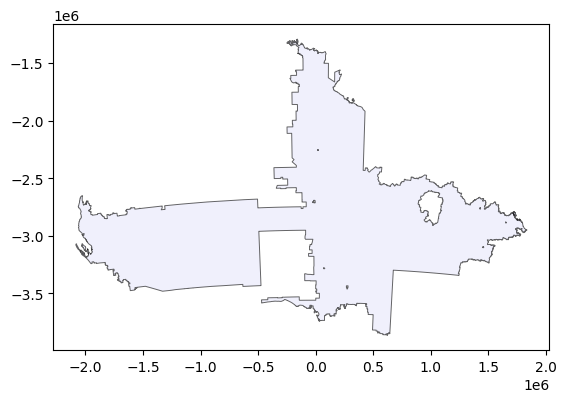

In [ ]:
statistical_areas_3112_NS.overlay(statistical_areas_3112_WE, how="union",keep_geom_type=True).dissolve().plot(facecolor='lavender', edgecolor='black',linewidth=0.7, alpha=0.6)

In [ ]:
statistical_areas_MID=statistical_areas_3112_NS.overlay(statistical_areas_3112_WE, how="union",keep_geom_type=True).dissolve()
statistical_areas_MID

,geometry,SA2_CODE21_1_1,SA2_NAME21_1_1,CHG_FLAG21_1_1,CHG_LBL21_1_1,SA3_CODE21_1_1,SA3_NAME21_1_1,SA4_CODE21_1_1,SA4_NAME21_1_1,GCC_CODE21_1_1,...,SA4_CODE21_2_2,SA4_NAME21_2_2,GCC_CODE21_2_2,GCC_NAME21_2_2,STE_CODE21_2_2,STE_NAME21_2_2,AUS_CODE21_2_2,AUS_NAME21_2_2,AREASQKM21_2_2,LOCI_URI21_2_2
0,"MULTIPOLYGON (((-2010696.148 -3160884.243, -20...",702011050,Petermann - Simpson,0,No change,70201,Alice Springs,702,Northern Territory - Outback,7RNTE,...,702,Northern Territory - Outback,7RNTE,Rest of NT,7,Northern Territory,AUS,Australia,175248.1135,http://linked.data.gov.au/dataset/asgsed3/SA2/...


In [ ]:
statistical_areas_MID['zone']='middles'
statistical_areas_MID=statistical_areas_MID.loc[:,['AUS_NAME21_1_1','zone','geometry']]
statistical_areas_MID

,AUS_NAME21_1_1,zone,geometry
0,Australia,middles,"MULTIPOLYGON (((-2010696.148 -3160884.243, -20..."


2. Mapa de la diferencia

<Axes: >

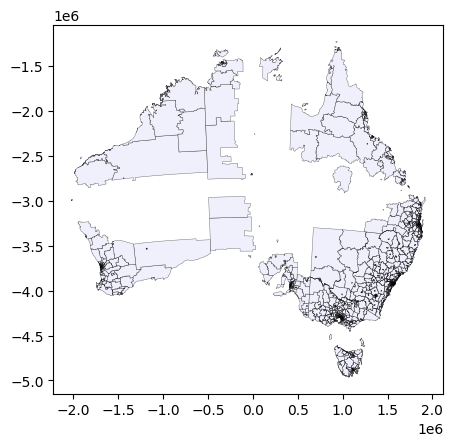

In [ ]:
statistical_areas_3112.overlay(statistical_areas_MID, how='difference').plot(facecolor='lavender', edgecolor='black',linewidth=0.3, alpha=0.6)

3. Mapas de la diferencia simetrica

<Axes: >

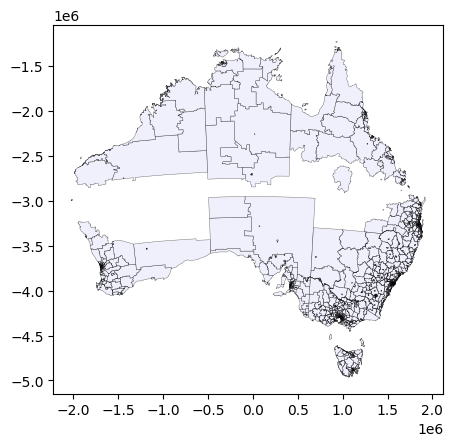

In [ ]:
statistical_areas_3112_N.overlay(statistical_areas_3112_S, how="symmetric_difference",keep_geom_type=True).plot(facecolor='lavender', edgecolor='black',linewidth=0.3, alpha=0.6)

<Axes: >

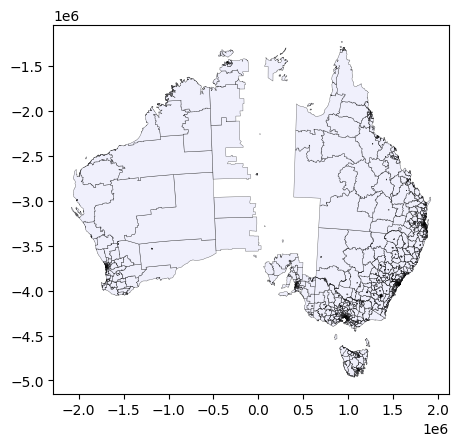

In [ ]:
statistical_areas_3112_E.overlay(statistical_areas_3112__W, how="symmetric_difference", keep_geom_type=True).plot(facecolor='lavender', edgecolor='black',linewidth=0.3, alpha=0.6)